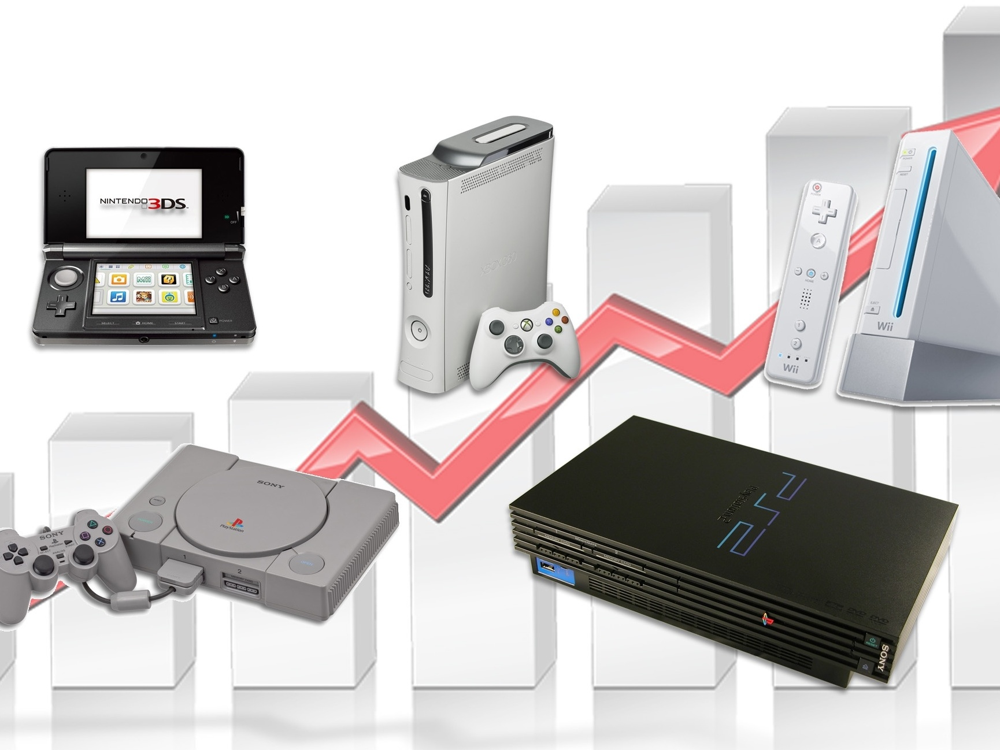

## <span style= "color:darkslateblue">Análise Exploratória de Dados - Venda de Jogos de Video Games ao Redor do Mundo</span>

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv('EDA - VIDEO GAME SALES.csv') #Arquivo desta análise

## Explorando o DataFrame: Aspectos Gerais

In [3]:
df.head() 

,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
0,1,Wii Sports,Wii,2006.0,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74
1,2,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24
2,3,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.85,12.88,3.79,3.31,35.82
3,4,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.75,11.01,3.28,2.96,33.00
4,5,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37


### Informações gerais do Dataframe, Número de linhas,Nome das colunas, seus tipos e quantidade de nulos

In [4]:
df.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16598 entries, 0 to 16597
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Rank          16598 non-null  int64  
 1   Name          16598 non-null  object 
 2   Platform      16598 non-null  object 
 3   Year          16327 non-null  float64
 4   Genre         16598 non-null  object 
 5   Publisher     16540 non-null  object 
 6   NA_Sales      16598 non-null  float64
 7   EU_Sales      16598 non-null  float64
 8   JP_Sales      16598 non-null  float64
 9   Other_Sales   16598 non-null  float64
 10  Global_Sales  16598 non-null  float64
dtypes: float64(6), int64(1), object(4)
memory usage: 1.4+ MB


### Formato: Linha x Coluna

In [5]:
df.shape 

(16598, 11)

### Lista das colunas do Dataframe

In [6]:
df.columns 

Index(['Rank', 'Name', 'Platform', 'Year', 'Genre', 'Publisher', 'NA_Sales',
       'EU_Sales', 'JP_Sales', 'Other_Sales', 'Global_Sales'],
      dtype='object')

### Colunas com valores nulos e as respectivas quantidades

In [7]:
print(df.isna().sum())

Rank              0
Name              0
Platform          0
Year            271
Genre             0
Publisher        58
NA_Sales          0
EU_Sales          0
JP_Sales          0
Other_Sales       0
Global_Sales      0
dtype: int64


### Tratando a coluna Publisher

In [8]:
df['Publisher'] =  df['Publisher'].fillna("No information")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16598 entries, 0 to 16597
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Rank          16598 non-null  int64  
 1   Name          16598 non-null  object 
 2   Platform      16598 non-null  object 
 3   Year          16327 non-null  float64
 4   Genre         16598 non-null  object 
 5   Publisher     16598 non-null  object 
 6   NA_Sales      16598 non-null  float64
 7   EU_Sales      16598 non-null  float64
 8   JP_Sales      16598 non-null  float64
 9   Other_Sales   16598 non-null  float64
 10  Global_Sales  16598 non-null  float64
dtypes: float64(6), int64(1), object(4)
memory usage: 1.4+ MB


### Excluindo as linhas em que os valores de ano são nulos. São poucas linhas em relação número total do DataFrame

In [9]:
df.dropna(inplace=True)
df.head(40)

,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
0,1,Wii Sports,Wii,2006.0,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74
1,2,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24
2,3,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.85,12.88,3.79,3.31,35.82
3,4,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.75,11.01,3.28,2.96,33.00
4,5,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37
5,6,Tetris,GB,1989.0,Puzzle,Nintendo,23.20,2.26,4.22,0.58,30.26
6,7,New Super Mario Bros.,DS,2006.0,Platform,Nintendo,11.38,9.23,6.50,2.90,30.01
7,8,Wii Play,Wii,2006.0,Misc,Nintendo,14.03,9.20,2.93,2.85,29.02
8,9,New Super Mario Bros. Wii,Wii,2009.0,Platform,Nintendo,14.59,7.06,4.70,2.26,28.62
9,10,Duck Hunt,NES,1984.0,Shooter,Nintendo,26.93,0.63,0.28,0.47,28.31


### Número de valores únicos por coluna

In [10]:
df.nunique()

Rank            16327
Name            11360
Platform           31
Year               39
Genre              12
Publisher         577
NA_Sales          408
EU_Sales          305
JP_Sales          244
Other_Sales       157
Global_Sales      621
dtype: int64

### Verificando se há linhas duplicadas no DataFrame

In [11]:
num_dupl = df.duplicated().sum()
print ("O Dataframe tem: {0} linhas duplicadas".format(num_dupl))

O Dataframe tem: 0 linhas duplicadas


# <font style=color:darkblue> Explorando Colunas</font>

### [NAME]

### TOP20 títulos que mais aparecem na lista

<AxesSubplot:>

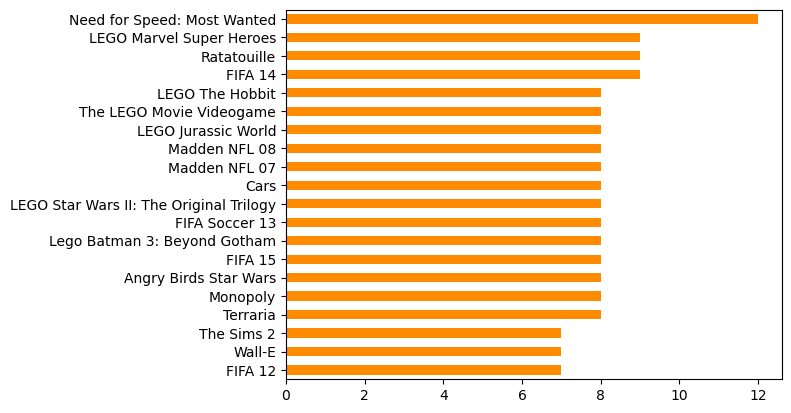

In [12]:
df['Name'].value_counts().head(20).sort_values(ascending=True).plot(kind = 'barh', color = 'darkorange')

### Mas se não há linhas duplicadas no DataFrame, porque esses títulos se repetem tantas vezes?

In [13]:
# Porque estes títulos saíram em múltiplas plataformas diferentes e até em anos diferentes.
# Need for Speed: Most Wanted como exemplo:


df [ df['Name'].str.contains('Need for Speed: Most Wanted') ]

,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
252,253,Need for Speed: Most Wanted,PS2,2005.0,Racing,Electronic Arts,2.03,1.79,0.08,0.47,4.37
498,499,Need for Speed: Most Wanted,PS3,2012.0,Racing,Electronic Arts,0.71,1.51,0.06,0.61,2.89
788,790,Need for Speed: Most Wanted 5-1-0,PSP,2005.0,Racing,Electronic Arts,1.77,0.13,0.02,0.18,2.10
1173,1175,Need for Speed: Most Wanted,X360,2012.0,Racing,Electronic Arts,0.62,0.80,0.01,0.15,1.58
1530,1532,Need for Speed: Most Wanted,X360,2005.0,Racing,Electronic Arts,1.00,0.17,0.02,0.10,1.29
1742,1744,Need for Speed: Most Wanted,PSV,2012.0,Racing,Electronic Arts,0.38,0.52,0.01,0.25,1.16
2005,2007,Need for Speed: Most Wanted,XB,2005.0,Racing,Electronic Arts,0.53,0.46,0.00,0.05,1.04
3585,3587,Need for Speed: Most Wanted,GC,2005.0,Racing,Electronic Arts,0.43,0.11,0.00,0.02,0.56
5900,5902,Need for Speed: Most Wanted,PC,2005.0,Racing,Electronic Arts,0.02,0.23,0.00,0.05,0.30
6149,6151,Need for Speed: Most Wanted,WiiU,2013.0,Racing,Electronic Arts,0.14,0.12,0.00,0.02,0.28


### Conforme indica o gráfico, Need for Speed: Most Wanted possui 13 ocorrências. É o título que mais saiu em plataformas de jogos eletrônicos

In [18]:
num_ocorrencias = df[ df['Name'].str.contains('Need for Speed: Most Wanted') ].Name.count()
print ("Need for Speed Most Wanted tem: {0} ocorrências no DataFrame".format(num_ocorrencias))

Need for Speed Most Wanted tem: 13 ocorrências no DataFrame


#### <span style= "color:darkslateblue">Need for Speed: Most Wanted</span>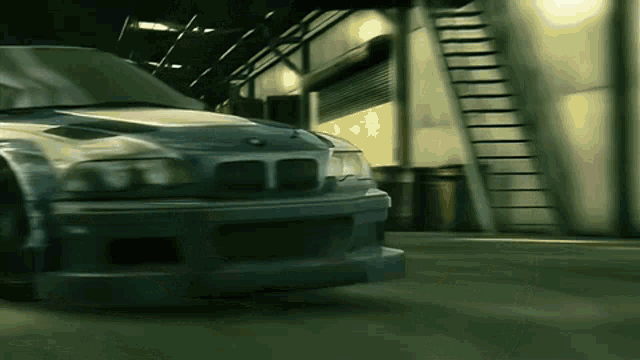

### [PLATFORM]

### Qual o número de valores únicos em Platform? Ou melhor ,há quantas plataformas de jogos na coluna 'Platform' ?

In [23]:
print('Há {0} plataformas de jogos'.format(df['Platform'].nunique()))

Há 31 plataformas de jogos


### E quais são elas?

In [39]:
lista_platform = df['Platform'].unique()
print(lista_platform)

['Wii' 'NES' 'GB' 'DS' 'X360' 'PS3' 'PS2' 'SNES' 'GBA' '3DS' 'PS4' 'N64'
 'PS' 'XB' 'PC' '2600' 'PSP' 'XOne' 'GC' 'WiiU' 'GEN' 'DC' 'PSV' 'SAT'
 'SCD' 'WS' 'NG' 'TG16' '3DO' 'GG' 'PCFX']


### TOP5 Número de títulos por Plataformas que menos aparecem no DataFrame

In [43]:
print( df['Platform'].value_counts().tail(5) )

WS      6
3DO     3
TG16    2
GG      1
PCFX    1
Name: Platform, dtype: int64


### TOP10 Números de títulos por Plataformas que mais aparecem no DataFrame

In [45]:
TOP10_Platform = df['Platform'].value_counts().head(10)
print( TOP10_Platform )

DS      2133
PS2     2127
PS3     1304
Wii     1290
X360    1235
PSP     1197
PS      1189
PC       943
GBA      811
XB       803
Name: Platform, dtype: int64


<AxesSubplot:>

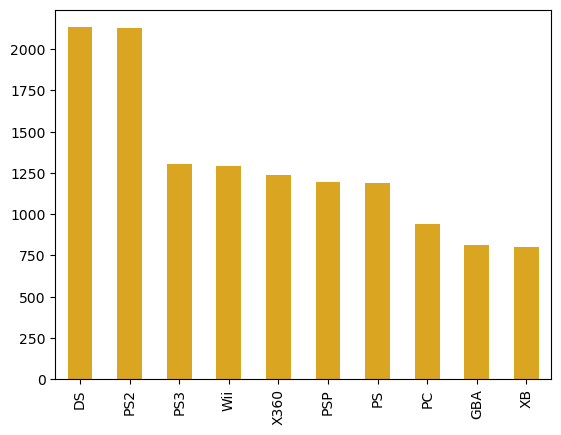

In [44]:
# Gráfico

df['Platform'].value_counts().head(10).plot(kind='bar' , color = 'goldenrod')

### Comparando as plataformas da Sony, Microsoft e Nintendo

In [143]:
# Lista das plataformas que são TOP10
TOP10 = df['Platform'].value_counts().head(10).index
print(TOP10)

Index(['DS', 'PS2', 'PS3', 'Wii', 'X360', 'PSP', 'PS', 'PC', 'GBA', 'XB'], dtype='object')


{'DS': 2133, 'Wii': 1290, 'GBA': 811}


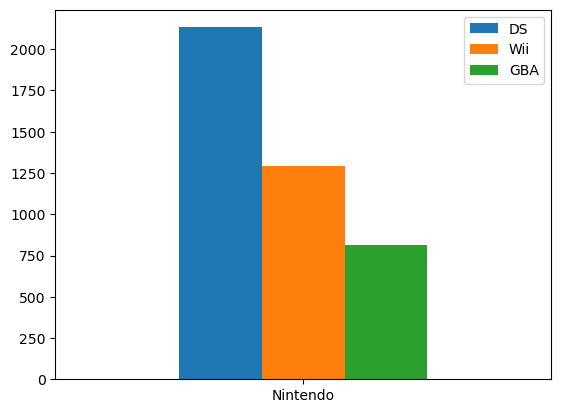

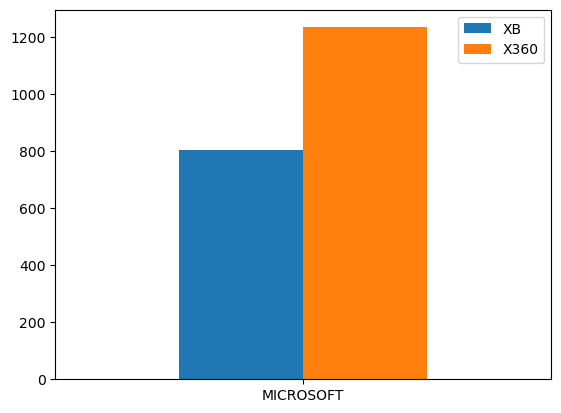

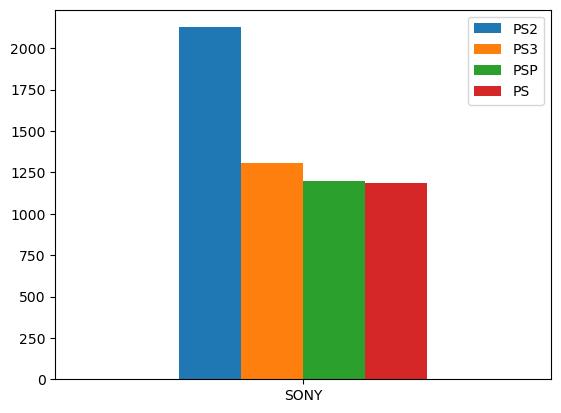

In [119]:
NINTENDO = { TOP10[0]:TOP10_Platform[0] , TOP10[3]:TOP10_Platform[3], TOP10[-2]:TOP10_Platform[-2] }
df_NINTENDO = pd.DataFrame(data=NINTENDO,index= ['Nintendo'])
df_NINTENDO.plot(kind='bar')
plt.xticks(rotation=0, horizontalalignment="center")

MICROSOFT = { TOP10[-1]:TOP10_Platform[-1], TOP10[4]:TOP10_Platform[4] } 
df_MICROSOFT = pd.DataFrame(data=MICROSOFT,index= ['MICROSOFT'])
df_MICROSOFT.plot(kind='bar')
plt.xticks(rotation=0, horizontalalignment="center")

SONY =  { TOP10[1]:TOP10_Platform[1], TOP10[2]:TOP10_Platform[2], 
           TOP10[5]:TOP10_Platform[5], TOP10[6]:TOP10_Platform[6] } 
df_SONY = pd.DataFrame(data=SONY,index= ['SONY'])
df_SONY.plot(kind='bar')
plt.xticks(rotation=0, horizontalalignment="center")



### Empilhar os gráficos e comparar qual a plataforma com mais títulos no DataFrame

(array([0, 1, 2]),
 [Text(0, 0, 'Nintendo'), Text(1, 0, 'MICROSOFT'), Text(2, 0, 'SONY')])

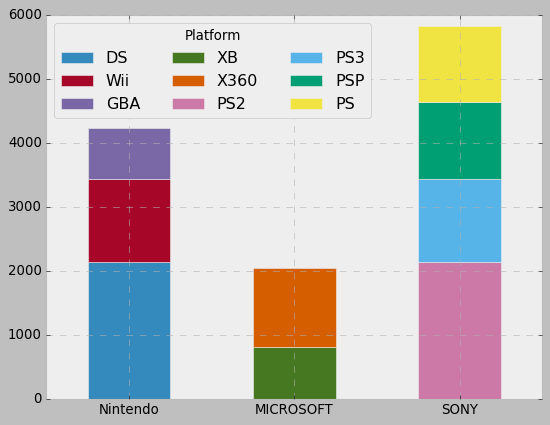

In [141]:
frames = [df_NINTENDO, df_MICROSOFT, df_SONY]
resultado = pd.concat(frames) 
resultado = resultado.fillna(0)
plt.style.use('bmh') 
resultado.plot(kind='bar',stacked=True).legend(
    loc='upper left', ncol=3, title="Platform"
)
plt.xticks(rotation=0, horizontalalignment="center")

### <span style= "color:darkslateblue">Apesar da plataforma que mais recebeu títulos ser da Nintendo (DS, com 2133), a maioria dos títulos do DataFrame saíram para as plataformas da Sony</span>
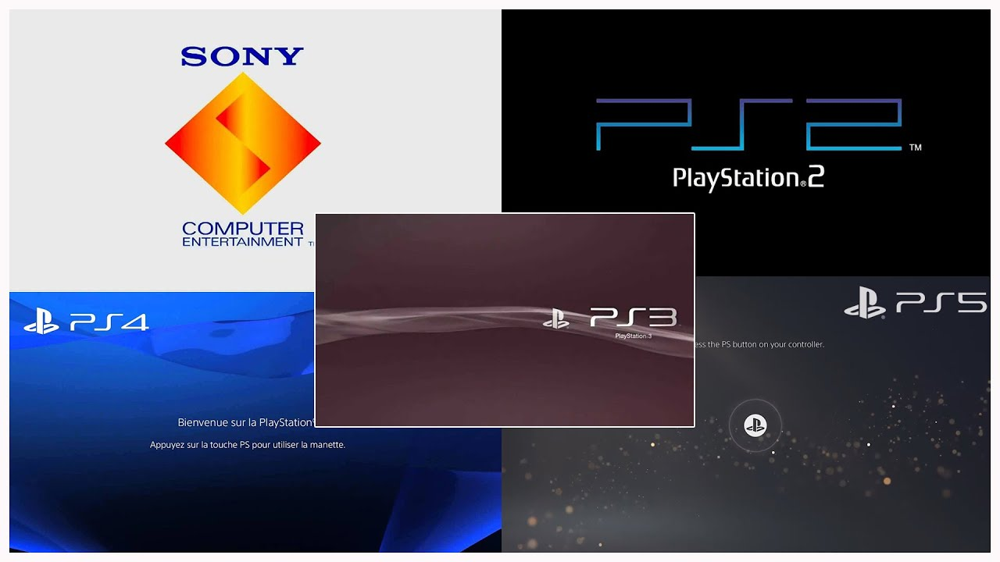

## [Year]

### Quantidade de anos que há no DataFrame

In [145]:
df['Year'].nunique()

39

### TOP20 Anos em que mais saíram títulos 

In [196]:
TOP20_anos = df['Year'].value_counts().head(20)
top20_1000 = TOP20_anos>1000
top20_1000.index

Float64Index([2009.0, 2008.0, 2010.0, 2007.0, 2011.0, 2006.0, 2005.0, 2002.0,
              2003.0, 2004.0, 2012.0, 2015.0, 2014.0, 2013.0, 2001.0, 1998.0,
              2000.0, 2016.0, 1999.0, 1997.0],
             dtype='float64')

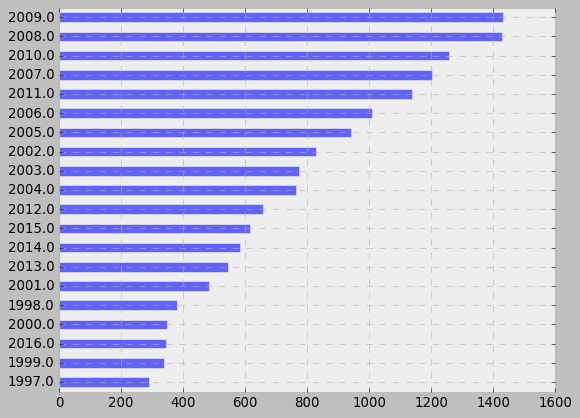

In [160]:
TOP20_anos.plot(kind='barh', color = '#6262ff').invert_yaxis()

### Anos que saíram mais de 1000 títulos

In [257]:
anos_1000 = df[df['Year'].isin(df['Year'].value_counts()[df['Year'].value_counts() > 1000].index)].Year.sort_values(ascending=True).unique()
print ("Os anos que saíram mais de 1000 títulos foram: {0} ".format (anos_1000) )


Os anos que saíram mais de 1000 títulos foram: [2006. 2007. 2008. 2009. 2010. 2011.] 


## [Genre]

### Como estão distribuídos o número de jogos por genêro e por ordem crescente?

<AxesSubplot:>

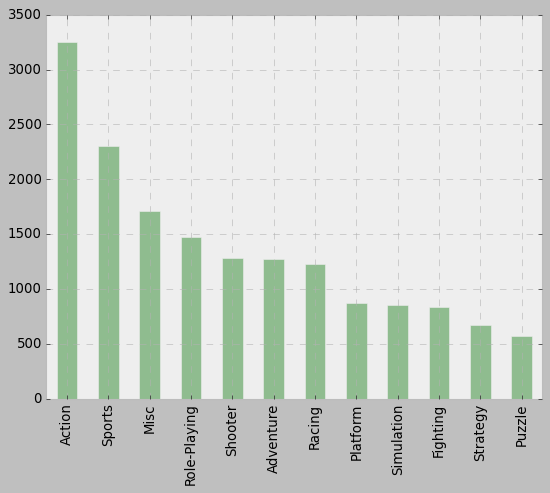

In [243]:
df.Genre.value_counts().plot(kind='bar',color='darkseagreen')

### Há quantos gêneros de jogos no DataFrame?

In [250]:
print("Há {0} gêneros de jogos no Dataframe".format ( df.Genre.nunique() ) )

Há 12 gêneros de jogos no Dataframe


### Ação é o Gênero com mais títulos no Dataframe

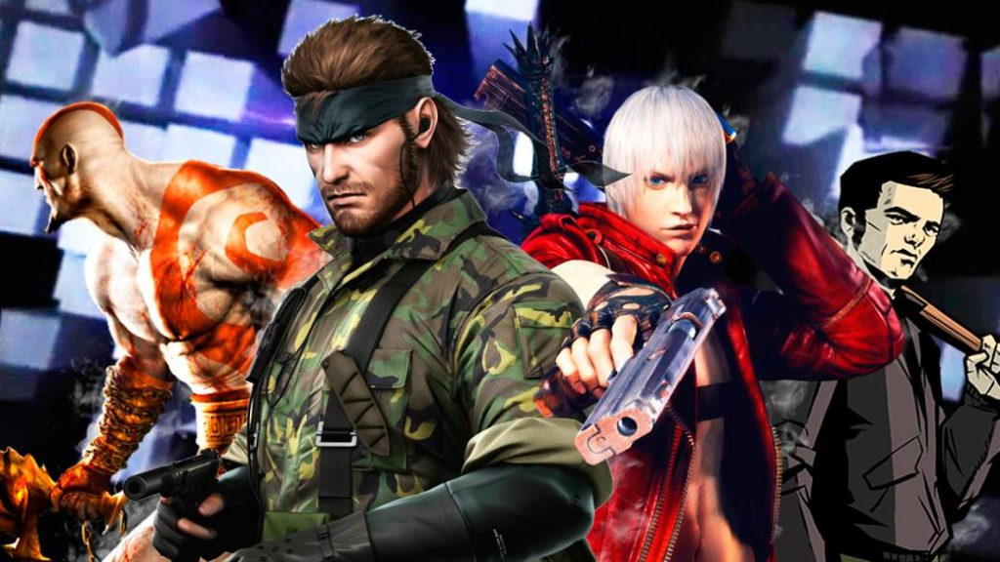

## [Publisher]

### TOP20 desenvolvedoras que mais aparecem no DataFrame

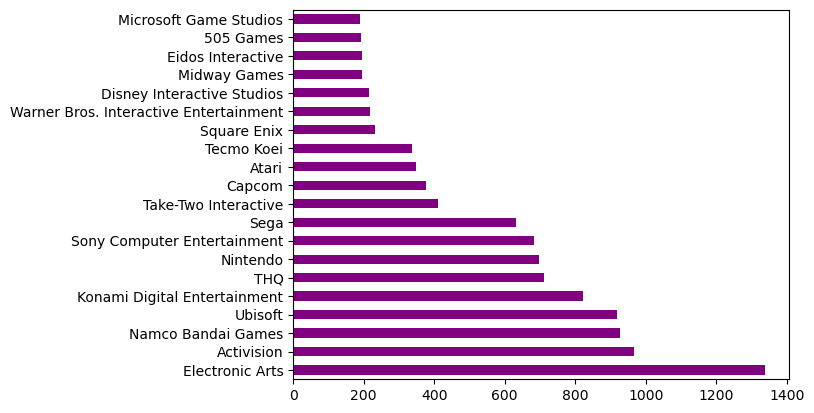

In [270]:
df.Publisher.value_counts().head(20).plot(kind='barh',color='purple')
plt.style.use('default') 

### Os jogos da Electronic Arts (EA) são os que mais aparecem no DataFrame
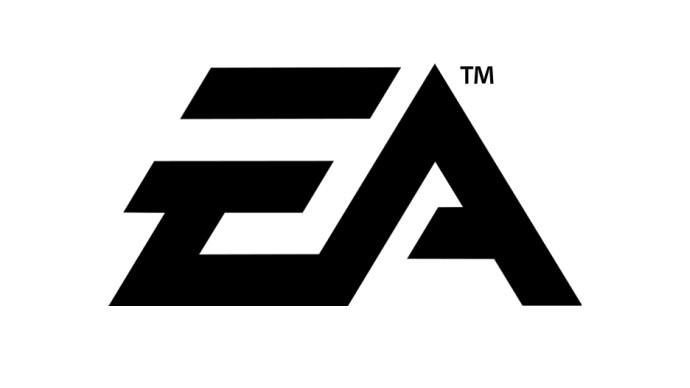

## [SALES]

In [288]:
# Vendas na América do Norte (em milhões de US$)
NA_Sales = df['NA_Sales'].sort_values(ascending=False).sum().round(2)
print(df['NA_Sales'].sort_values(ascending=False).sum().round(2))

# Vendas na Europa (em milhões de US$)
EU_Sales = df['EU_Sales'].sort_values(ascending=False).sum().round(2)
print(df['EU_Sales'].sort_values(ascending=False).sum().round(2))

# Vendas no Japão (em milhões de US$)
JP_Sales = df['JP_Sales'].sort_values(ascending=False).sum().round(2)
print(df['JP_Sales'].sort_values(ascending=False).sum().round(2))

# Vendas no Resto do mundo (em milhões de US$)
Other_Sales = df['Other_Sales'].sort_values(ascending=False).sum().round(2)
print(df['Other_Sales'].sort_values(ascending=False).sum().round(2))
 
# Vendas Globais (Total) (em milhões de US$)
Global_Sales = df['Global_Sales'].sort_values(ascending=False).sum().round(2)
print(df['Global_Sales'].sort_values(ascending=False).sum().round(2))

4333.43
2409.12
1284.3
789.01
8820.36


### Caracterização das vendas globais por região: A América do Norte foi a região com maior faturamento

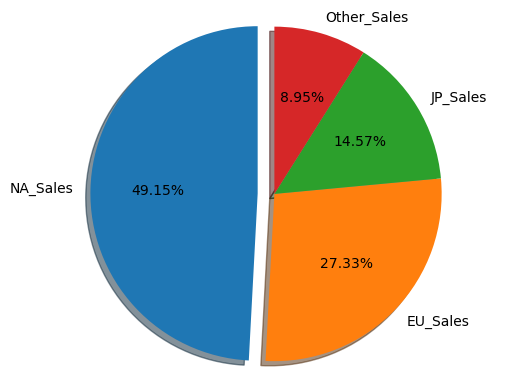

In [302]:
labels = 'NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales'
sizes = [NA_Sales, EU_Sales, JP_Sales, Other_Sales]
explode = (0.1, 0, 0, 0)  # só explode o Primeiro Pedaço (slice) 

fig1, ax1 = plt.subplots()
ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.2f%%',
        shadow=True, startangle=90)
ax1.axis('equal')  # Garantr que o gráfico saia com aspecto circular.

plt.show()

In [ ]:
Numero de vendas por plataforma
Game Sales by Genre


Fazer uma relação das colunas não categoricas X colunas categoricas

In [304]:
Name = df['Name'].value_counts().head(20).sort_values(ascending=False)
Name

Need for Speed: Most Wanted                12
LEGO Marvel Super Heroes                    9
Ratatouille                                 9
FIFA 14                                     9
Terraria                                    8
Monopoly                                    8
Angry Birds Star Wars                       8
FIFA 15                                     8
Lego Batman 3: Beyond Gotham                8
FIFA Soccer 13                              8
LEGO Star Wars II: The Original Trilogy     8
Cars                                        8
LEGO The Hobbit                             8
Madden NFL 07                               8
Madden NFL 08                               8
LEGO Jurassic World                         8
The LEGO Movie Videogame                    8
Wall-E                                      7
The Sims 2                                  7
FIFA 12                                     7
Name: Name, dtype: int64

<AxesSubplot:xlabel='Global_Sales'>

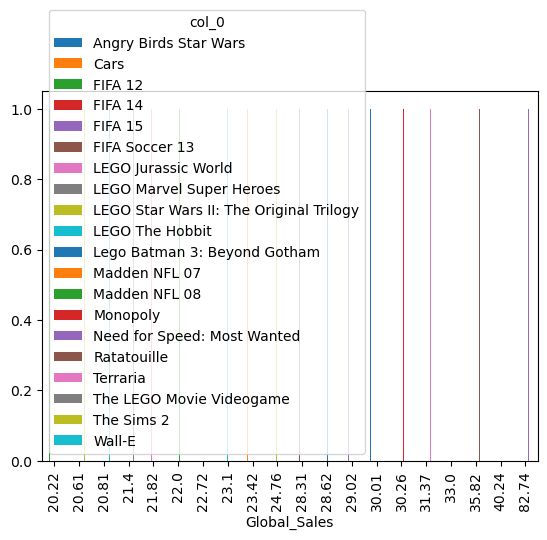

In [317]:
pd.crosstab(df['Global_Sales'].sort_values(ascending=False).head(20),Name.index).plot(kind='bar')